# Audio Signal Processing with Python's Librosa

Read [my blog post](https://daehnhardt.com/blog/2023/03/05/python-audio-signal-processing-with-librosa/) for details.

In [1]:
from IPython.display import Audio
import librosa.display
import matplotlib.pyplot as plt

In [2]:
import sounddevice as sd
import soundfile as sf
import numpy as np
import wave
import librosa

# Record your voice

In [3]:
import sounddevice as sd

# Set the sampling frequency and duration of the recording
sampling_frequency = 44100
duration = 5  # in seconds

# Record audio
print("Recording...")
audio = sd.rec(int(sampling_frequency * duration), samplerate=sampling_frequency, channels=1)
sd.wait()  # Wait until recording is finished
print("Finished recording")


Recording...
Finished recording


# Saving your recording

In [4]:
import soundfile as sf

# Save the recorded audio to a WAV file
sf.write('voice.wav', audio, sampling_frequency)

# Play the recording

In [5]:
sd.play(audio, sampling_frequency)
sd.wait()

# Loading WAV files

In [6]:
with wave.open('voice.wav', 'rb') as wav_file:
    channels_number, sample_width, framerate, frames_number, compression_type, compression_name = wav_file.getparams()
    frames = wav_file.readframes(frames_number)
    audio_signal = np.frombuffer(frames, dtype='<i2')

In [7]:
channels_number, sample_width, framerate, frames_number, compression_type, compression_name

(1, 2, 44100, 220500, 'NONE', 'not compressed')

In [8]:
Audio(audio_signal, rate=sampling_frequency)

## Downloading from freesound.org

#### Used soundtracks

I thank [LoopMaiden](https://freesound.org/people/LoopMaiden) for these beautiful soundtracks used in this post:

1. Sacrifice (mp3) https://freesound.org/people/LoopMaiden/sounds/567852/
2. Drums (mp3) https://freesound.org/people/LoopMaiden/sounds/565186/


In [9]:
# Getting the sacrifice sound file
!wget https://cdn.freesound.org/previews/567/567852_12708796-lq.mp3

--2023-03-05 22:20:33--  https://cdn.freesound.org/previews/567/567852_12708796-lq.mp3
Resolving cdn.freesound.org (cdn.freesound.org)... 135.181.72.154
Connecting to cdn.freesound.org (cdn.freesound.org)|135.181.72.154|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 475952 (465K) [audio/mpeg]
Saving to: '567852_12708796-lq.mp3.3'

567852_12708796-lq. 100%[===================>] 464.80K  2.23MB/s    in 0.2s    

2023-03-05 22:20:33 (2.23 MB/s) - '567852_12708796-lq.mp3.3' saved [475952/475952]



In [10]:
# Getting the drums sound file
!wget https://cdn.freesound.org/previews/565/565186_12708796-lq.mp3

--2023-03-05 22:20:33--  https://cdn.freesound.org/previews/565/565186_12708796-lq.mp3
Resolving cdn.freesound.org (cdn.freesound.org)... 135.181.72.154
Connecting to cdn.freesound.org (cdn.freesound.org)|135.181.72.154|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 84984 (83K) [audio/mpeg]
Saving to: '565186_12708796-lq.mp3.3'

565186_12708796-lq. 100%[===================>]  82.99K  --.-KB/s    in 0.09s   

2023-03-05 22:20:34 (958 KB/s) - '565186_12708796-lq.mp3.3' saved [84984/84984]



In [11]:
sacrifice_file = "567852_12708796-lq.mp3"
drums_file = "565186_12708796-lq.mp3.1"

# Librosa use cases

## Loading an audio file

In [12]:
sacrifice_signal, sample_rate = librosa.load(sacrifice_file)

In [13]:
Audio(data=sacrifice_signal, rate=sample_rate)

# Plotting the signal amplitude

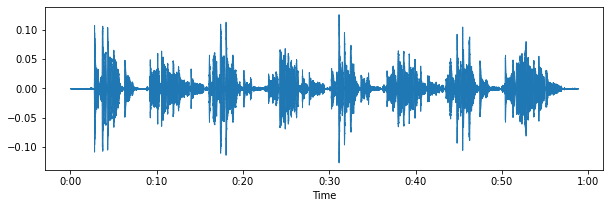

In [14]:
import librosa.display

plt.figure(figsize=(10, 3))
librosa.display.waveshow(sacrifice_signal, sr=sample_rate) # use waveplot should waveshow be unavailable
plt.show()

## The mel-spectrogram

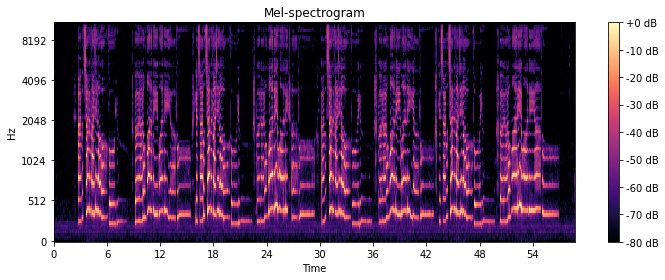

In [15]:
# Load the recorded file
signal, sr = librosa.load(sacrifice_file)

# Compute the mel-spectrogram
mel_spectrogram = librosa.feature.melspectrogram(y=signal, sr=sr)

# Plot the mel-spectrogram
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.power_to_db(mel_spectrogram, ref=np.max), sr=sr, hop_length=512, y_axis="mel", x_axis="time")
plt.colorbar(format="%+2.0f dB")
plt.title("Mel-spectrogram")
plt.tight_layout()
plt.show()

In [16]:
mel_spectrogram

array([[8.6759080e-08, 8.1862680e-08, 2.1721085e-08, ..., 9.7081141e-08,
        9.0149932e-08, 2.5203136e-07],
       [2.5509055e-07, 4.5715746e-07, 5.5796284e-07, ..., 4.6257932e-07,
        7.5741809e-07, 6.4309518e-07],
       [4.5354949e-07, 6.1497201e-07, 1.5107657e-06, ..., 2.4389235e-06,
        4.7857011e-06, 2.3308990e-06],
       ...,
       [1.6104870e-09, 3.4708965e-09, 3.7480508e-09, ..., 1.1005507e-09,
        1.7327233e-09, 3.0494558e-09],
       [1.8408958e-10, 4.1122933e-10, 2.1915571e-10, ..., 3.3125191e-10,
        3.7715914e-10, 5.4983756e-10],
       [2.2381045e-12, 2.8185846e-12, 2.0125798e-12, ..., 4.5505917e-12,
        6.7639215e-12, 9.8445193e-12]], dtype=float32)

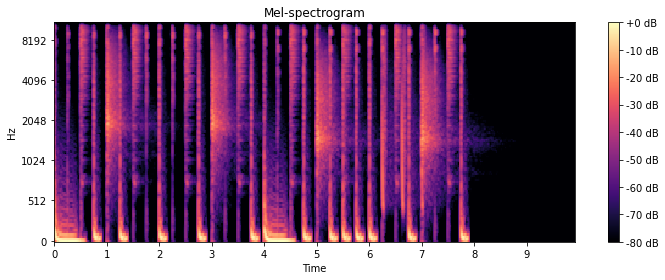

In [17]:
# Load the recorded file
drums_signal, sr = librosa.load(drums_file)

# Compute the mel-spectrogram
mel_spectrogram = librosa.feature.melspectrogram(y=drums_signal, sr=sr)

# Plot the mel-spectrogram
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.power_to_db(mel_spectrogram, ref=np.max), sr=sr, hop_length=512, y_axis="mel", x_axis="time")
plt.colorbar(format="%+2.0f dB")
plt.title("Mel-spectrogram")
plt.tight_layout()
plt.show()

## Mel-Frequency Cepstral Coefficients 

In [18]:
# extract MFCCs
mfccs = librosa.feature.mfcc(y=sacrifice_signal, sr=sample_rate)

In [19]:
mfccs

array([[-718.0983    , -714.62036   , -714.26794   , ..., -701.2012    ,
        -706.69806   , -710.34985   ],
       [  13.860107  ,   18.418316  ,   18.285805  , ...,   34.14977   ,
          24.460789  ,   21.746822  ],
       [  13.0396805 ,   16.68719   ,   15.259602  , ...,   24.350578  ,
          20.935247  ,   20.20428   ],
       ...,
       [  -6.753648  ,   -6.3677974 ,   -3.5676217 , ...,   -0.77700734,
          -2.8421237 ,   -5.1242743 ],
       [  -6.150442  ,   -5.963284  ,   -2.7150192 , ...,   -0.83888555,
          -3.8434372 ,   -4.993577  ],
       [  -5.4489803 ,   -5.6858215 ,   -2.7151508 , ...,   -3.6655302 ,
          -6.600809  ,   -5.61689   ]], dtype=float32)

## Spectral Contrast

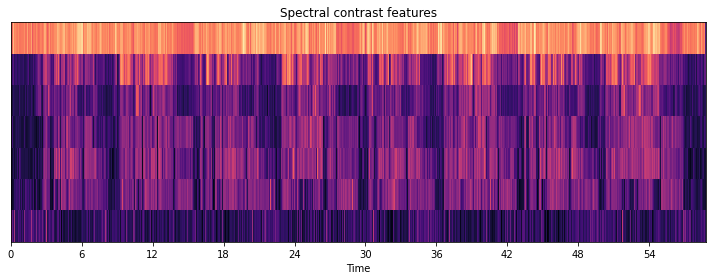

In [20]:
# Compute the spectral contrast features
spectral_contrast = librosa.feature.spectral_contrast(y=sacrifice_signal, n_fft=2048, hop_length=512)

# Plot the spectral contrast features
plt.figure(figsize=(10, 4))
librosa.display.specshow(spectral_contrast, sr=sample_rate, hop_length=512, x_axis="time")
plt.title("Spectral contrast features")
plt.tight_layout()
plt.show()

## Chroma Features

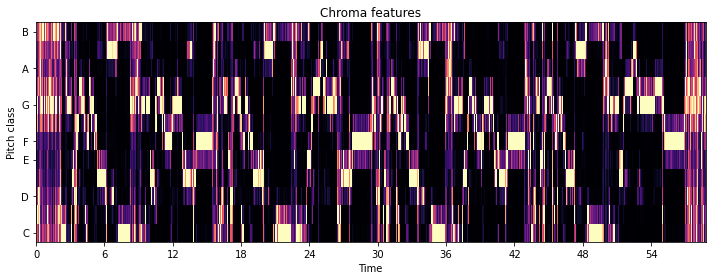

In [21]:
# Compute the chroma features
chroma_features = librosa.feature.chroma_stft(y=sacrifice_signal, sr=sample_rate)

# Plot the chroma features
plt.figure(figsize=(10, 4))
librosa.display.specshow(chroma_features, sr=sample_rate, hop_length=512, x_axis="time", y_axis="chroma")
plt.title("Chroma features")
plt.tight_layout()
plt.show()

In [22]:
# Load audio file
drums_signal, sr = librosa.load(drums_file)

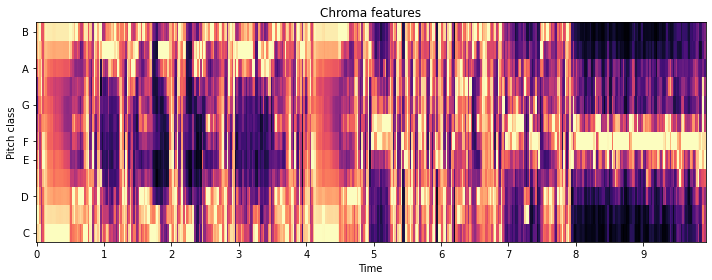

In [23]:
# Compute the chroma features
chroma_features = librosa.feature.chroma_stft(y=drums_signal, sr=sr)

# Plot the chroma features
plt.figure(figsize=(10, 4))
librosa.display.specshow(chroma_features, sr=sr, hop_length=512, x_axis="time", y_axis="chroma")
plt.title("Chroma features")
plt.tight_layout()
plt.show()

# Pitch

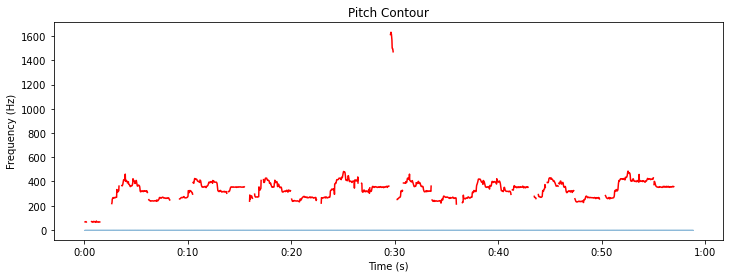

In [24]:
# Load audio file
y, sr = librosa.load(sacrifice_file)

# Compute pitch 
f0, voiced_flag, voiced_probs = librosa.pyin(y, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))

# Plot pitch contour
plt.figure(figsize=(12, 4))
librosa.display.waveshow(y, sr=sr, alpha=0.5)
plt.plot(librosa.frames_to_time(range(len(f0))), f0, color='r')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.title('Pitch Contour')
plt.show()

In [25]:
Audio(y, rate=sr)

# Pitch shift

In [26]:
# Shift the pitch down by two semitones
pitch_shifted_waveform = librosa.effects.pitch_shift(y=y, sr=sr, n_steps=-2.0)

In [27]:
Audio(pitch_shifted_waveform, rate=sr)

In [28]:
# Normalize the output signal
pitch_shifted = librosa.util.normalize(pitch_shifted_waveform)

In [29]:
Audio(pitch_shifted, rate=sr)

In [30]:
# Shift the pitch up by five semitones
pitch_shifted_helium_voice = librosa.effects.pitch_shift(y=y, sr=sr, n_steps=5.0)

Audio(pitch_shifted_helium_voice, rate=sr)

# Time Stretch


In [31]:
# Stretch the time by a factor of 2
time_stretched_waveform = librosa.effects.time_stretch(pitch_shifted_helium_voice, rate=2)

In [32]:
Audio(time_stretched_waveform, rate=sr)

# Beats generation

In [33]:
# Set the parameters for the WAV file
duration = 5.0  # seconds
frequency = 440.0  # Hz (A440)

# Generate the audio data for the WAV file
num_samples = 5000 
data = librosa.tone(frequency, sr=22050, length=num_samples)

Audio(data, rate=22050)